<a href="https://colab.research.google.com/github/bustardchad/ML_Turb/blob/main/Turb_Unet_Projection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Framework for a simple U-net mapping between input and target variables
## Motivation
Cosmic rays and magnetic fields impact gas distributions in turbulence, leaving distinct imprints on the gas that may allow us to learn about the underlying magnetic field topology or cosmic ray energy density by just looking at gas density images.

Here we explore whether a neural network architecture called a U-net can successfully map between gas density and magnetic energy density / cosmic ray energy density when trained on thousands of images from turbulence simulations.

##  Model outline
#### Training phase

1. Gas density slices are downsampled and then upsampled

2. Loss is calculated as MSE loss against the corresponding target image, gradients are calculated, weights are updated, and we iterate.


#### Training data:
Currently set up to train on the subsonic MHD turbulent box simulations with initial plasma beta ~ 10 (Bustard and Oh 2023)

Data can be presplit or loaded in full



In [1]:
#@title Import packages and download data { display-mode: "form" }

# see what type of GPU we have
!nvidia-smi -L  

# import packages, download turbulence snapshots, etc.
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data.dataloader import DataLoader
from torch.utils.data import TensorDataset, random_split
import pdb
import os

!pip install cmasher
!pip install torchmetrics
#!pip install git+https://github.com/huggingface/diffusers

# Make device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"

GPU 0: Tesla T4 (UUID: GPU-3134be21-1377-5578-7663-ec4f427e632b)
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.1/367.1 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 kB 4.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 11.0 MB/s eta 0:00:00


In [2]:
# default configuration -- some params are changed in for loops later
from dataclasses import dataclass

@dataclass
class TrainingConfig:
    sim_type = 'unet' # either 'unet' or 'classify'
    batch_size = 64
    fileDirArr = ['MHD_beta10_projection']
    field_list = ['density','magnetic_energy_density']
    projection_depth = 8
    data_presplit = True # whether data has already been split into training, val, test
    killPwr = False
    use_transforms = True # further augment with horiz/vertical flipping
    hold_out_test_set = False
    # For training
    epochs = 10
    stop_early = True
    patience = 5
    use_ssim = True # add SSIM to loss function
    run_locally = True # only set true if you are Chad
    run_colab = True
    path_to_dir = 'drive/MyDrive/Turb_Sims/Image_Cubes/Multiple_Snapshots_Small/Full_Power/'
    #path_to_dir = 'drive/MyDrive/Turb_Sims/Image_Cubes/Multiple_Snapshots_Large/Full_Power/'
    #path_to_dir = '' # if downloading from Google Drive
    dataset_size = 'small' # 'small' or 'large'
    save_dir = 'runs/'
    run_name = 'MHD_Unet_projection_depth_8'

config = TrainingConfig()

## Preprocess the data

In [3]:
# For downloading the data from my Google Drive (only works for Chad)
from google.colab import drive

# For downloading the relevant data from Google Drive
!pip install --upgrade --no-cache-dir gdown
import gdown

if (config.run_locally and config.run_colab):
  drive.mount('/content/drive')
  
elif ((config.run_locally==False) and (config.run_colab)):
  # Note: for this U-net script, only the MHD_beta10 sims are in the 'large' url
  # This keeps us from downloading an enormous amount of data

  # Assuming Full_Power, i.e. config.killPwr==False
  if (config.dataset_size =='large'):
    url = "https://drive.google.com/drive/folders/1bcria892xcIrZNVbE2MCF_R_Bhz1xXdg"

    if config.killPwr:
      raise Exception("Large data files with flattened power spectra not uploaded to Google Drive yet")

  elif (config.dataset_size =='small'):
    url = "https://drive.google.com/drive/folders/1gSfyMstWIO8BjAoD_6t-a5xDmMd6cfCW"
    
    if config.killPwr:
      url = "https://drive.google.com/drive/folders/1_QCS78V1XB7YYTQc2alutmC1wmNSt9nx"
  else:
    raise Exception("Error: Need to specify dataset_size in config")
 
  # download the data
  gdown.download_folder(url)

else:
  raise Exception("You are running on Google Colab but run_colab is set to False")



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6
Mounted at /content/drive


In [4]:
# If on Google Colab, need to clone repo to have access to helper files

!git clone https://github.com/bustardchad/ML_Turb

import ML_Turb.utilities.load_data as load_data
import ML_Turb.utilities.unet as unet
import ML_Turb.utilities.unet_setup as unet_setup
import ML_Turb.utilities.interpret_CNN as interp

Cloning into 'ML_Turb'...
remote: Enumerating objects: 358, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 358 (delta 7), reused 10 (delta 3), pack-reused 344
Receiving objects: 100% (358/358), 60.95 MiB | 26.40 MiB/s, done.
Resolving deltas: 100% (181/181), done.


In [5]:
from torchmetrics import StructuralSimilarityIndexMeasure
ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

from ML_Turb.utilities.unet import UNet

def create_model(config, n_blocks, start_filts, lr, weight_decay):
  # TODO: Change this part to use unet.py from elektronn3
  model = UNet(in_channels=1,
             out_channels=1,
             #n_blocks=3,
             n_blocks=n_blocks,
             start_filts=start_filts,
             activation='relu',
             normalization='batch',
             conv_mode='same',
             dim=2).to(device)

  #loss_fn = nn.CrossEntropyLoss()
  loss_fn = nn.MSELoss() #default reduction='mean'

  #opt = torch.optim.SGD(model.parameters(),
  #                            lr=lr,momentum=mmtm)
  opt = torch.optim.AdamW(model.parameters(),
                                lr = lr, 
                                weight_decay = weight_decay)

  return model, loss_fn, opt

  

## Run the U-net


In [ ]:
# Uncomment and run below to check that U-net input and output
# shapes match 
"""
torch.cuda.empty_cache()

# create the model
model, loss_fn, opt = create_model(config)


for data in iter(train_dl):
    x, y, z = data
    print(x.dtype, y.dtype, z.dtype)
    print(x.shape, y.shape, z.shape)
    with torch.no_grad():
        out = model(x.to(device))
        print(f'Out: {out.shape}')

    break # just do one
"""

"\nfor data in iter(train_dl):\n    x, y, z = data\n    print(x.dtype, y.dtype, z.dtype)\n    print(x.shape, y.shape, z.shape)\n    with torch.no_grad():\n        out = model(x.to(device))\n        print(f'Out: {out.shape}')\n\n    break # just do one\n"

In [6]:
# Get set up to model
torch.cuda.empty_cache()

!mkdir 'runs'

# load data only once if not changing batch size
train_dl, valid_dl, test_dl = load_data.preprocess(config)

Loading training files /train_MHD_beta10_projection_density_depth_8_small.npy and /train_MHD_beta10_projection_magnetic_energy_density_depth_8_small.npy for U-net mapping


Epoch: 0 | Train Loss: 0.11767| Validation loss: 0.08274


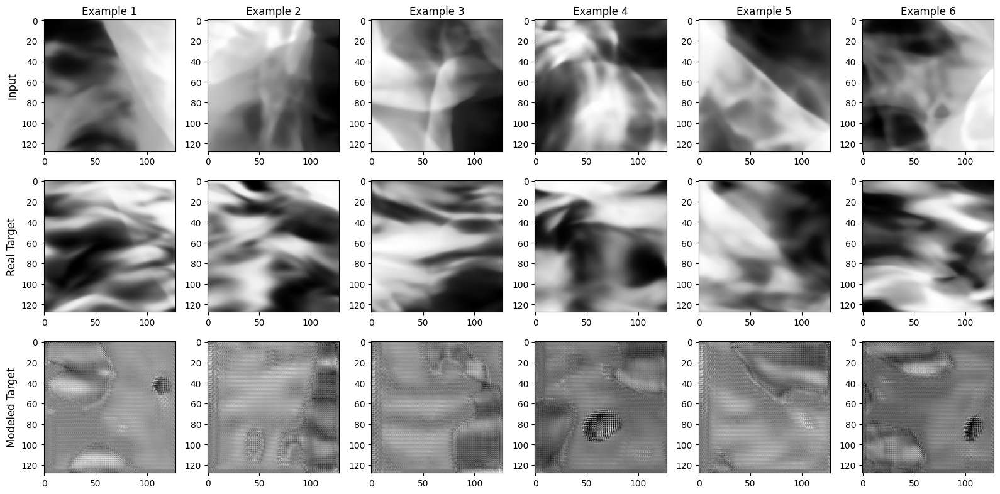

Epoch: 1 | Train Loss: 0.07812| Validation loss: 0.07590


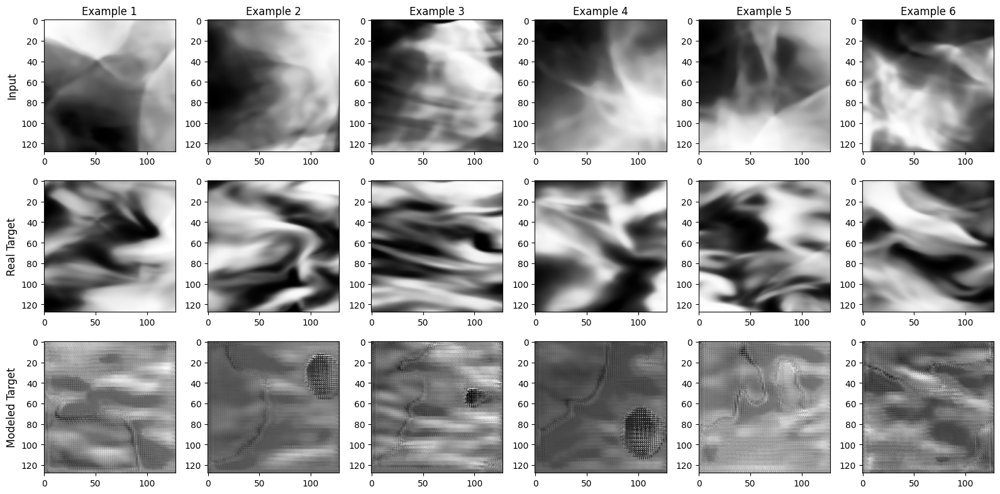

Saving model checkpoint
Epoch: 2 | Train Loss: 0.07408| Validation loss: 0.07236


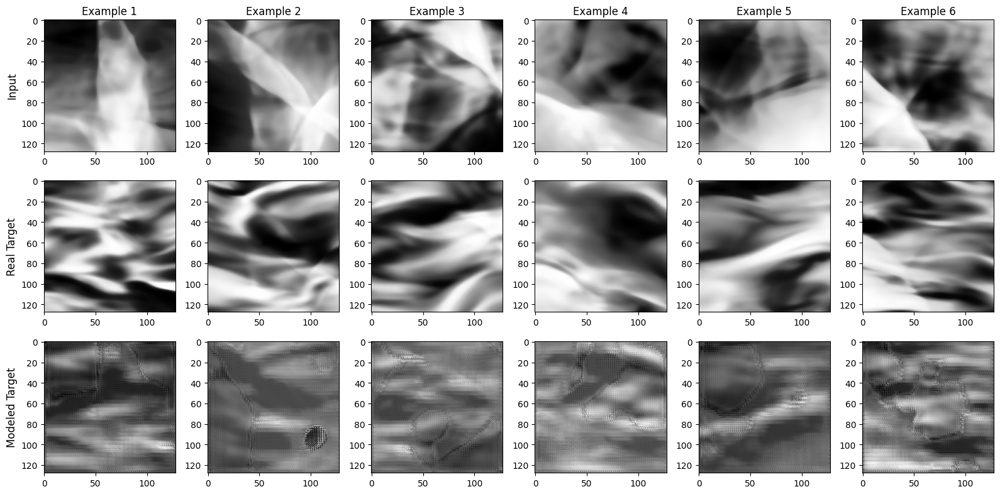

Saving model checkpoint
Epoch: 3 | Train Loss: 0.07247| Validation loss: 0.07238


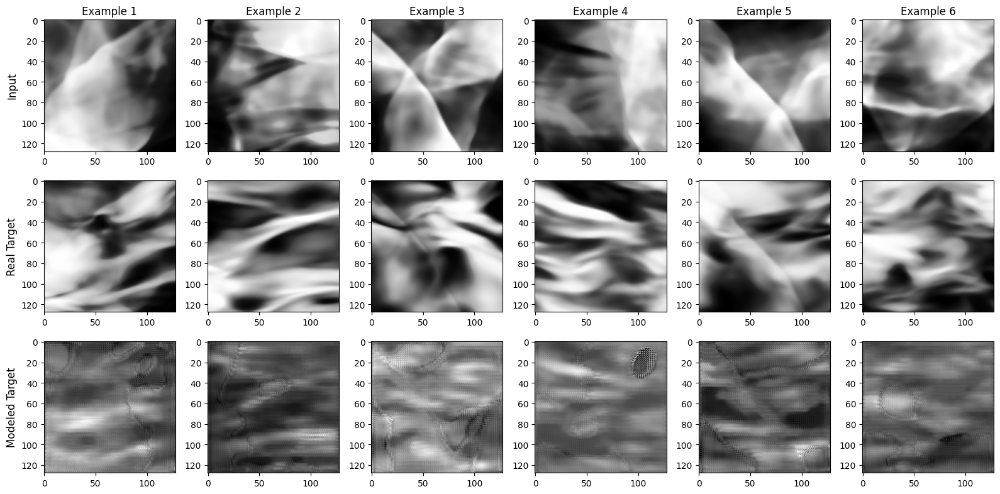

Epoch: 4 | Train Loss: 0.07139| Validation loss: 0.07324


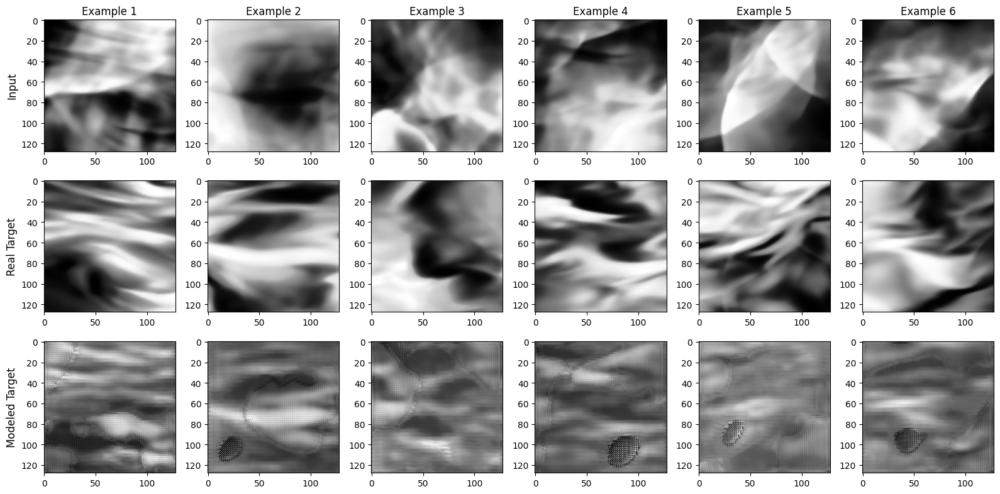

Epoch: 5 | Train Loss: 0.07063| Validation loss: 0.07032


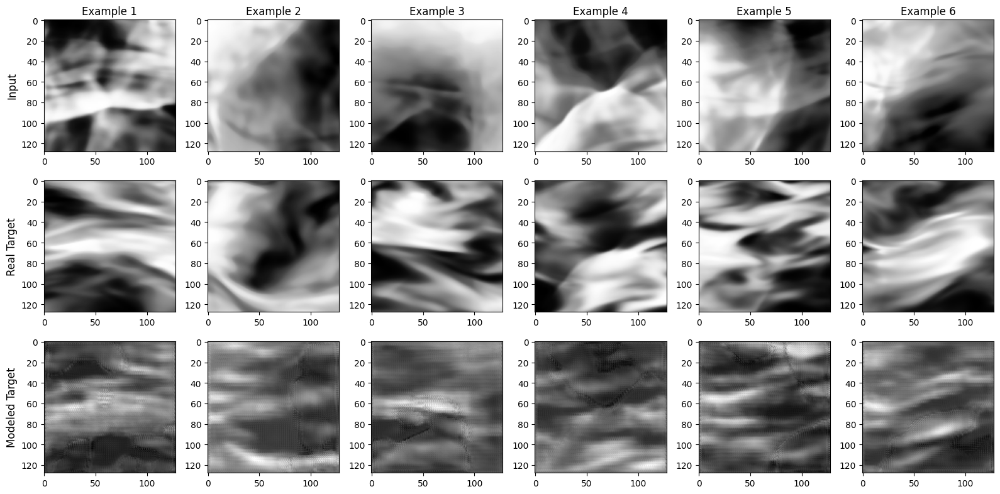

Saving model checkpoint
Epoch: 6 | Train Loss: 0.06986| Validation loss: 0.06973


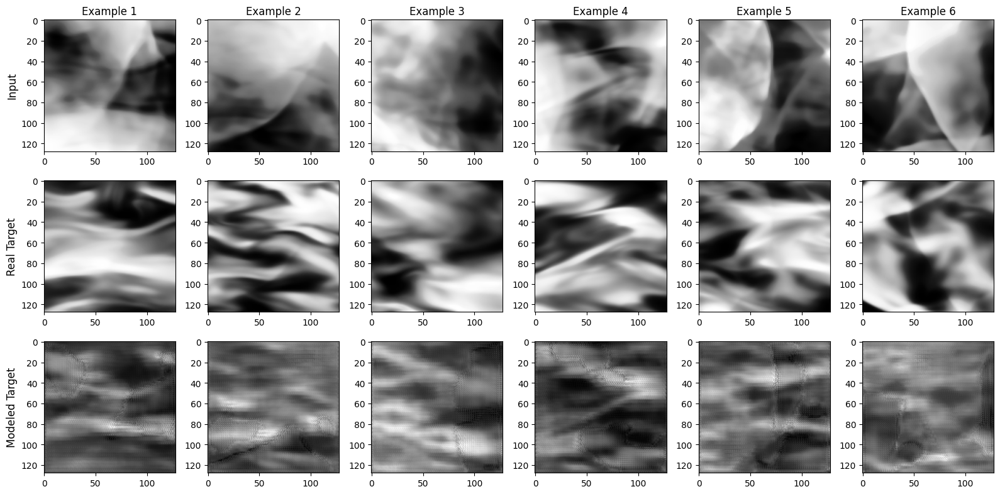

Saving model checkpoint
Epoch: 7 | Train Loss: 0.06945| Validation loss: 0.06907


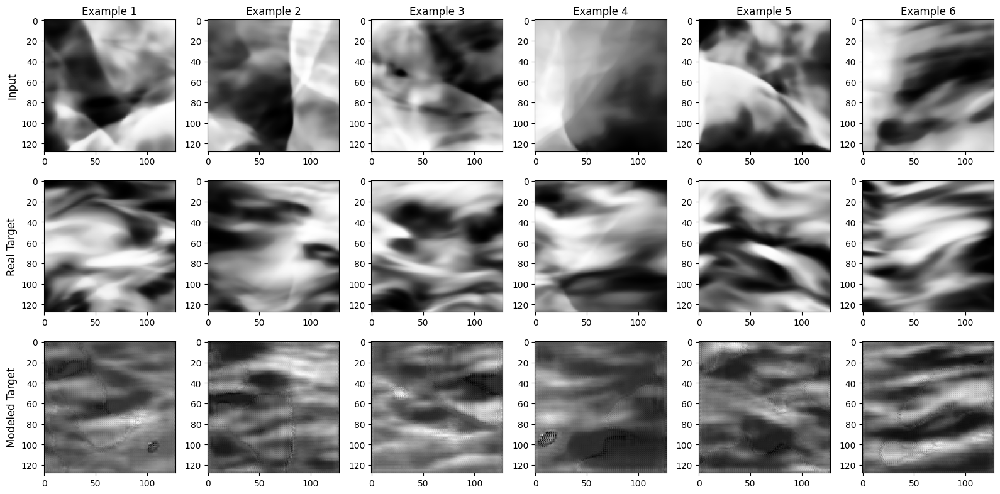

Saving model checkpoint
Epoch: 8 | Train Loss: 0.06874| Validation loss: 0.06845


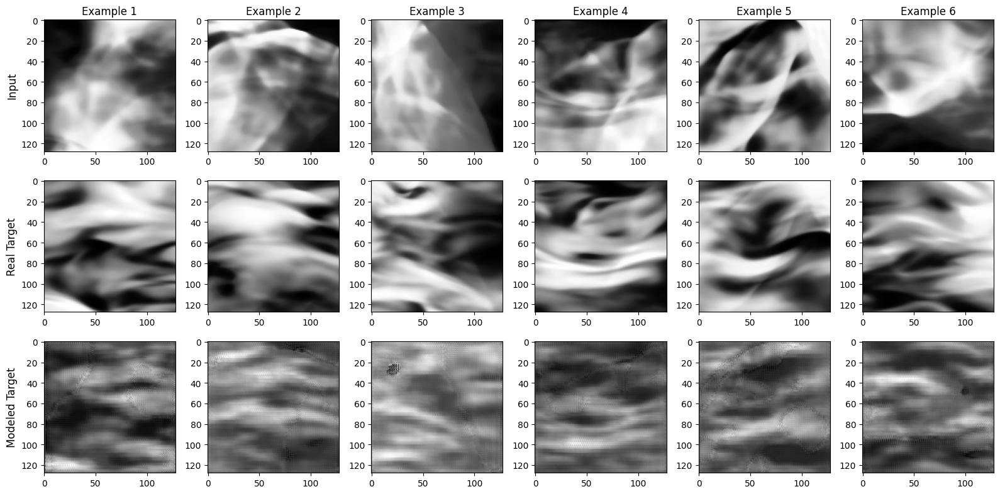

Saving model checkpoint
Epoch: 9 | Train Loss: 0.06823| Validation loss: 0.06883


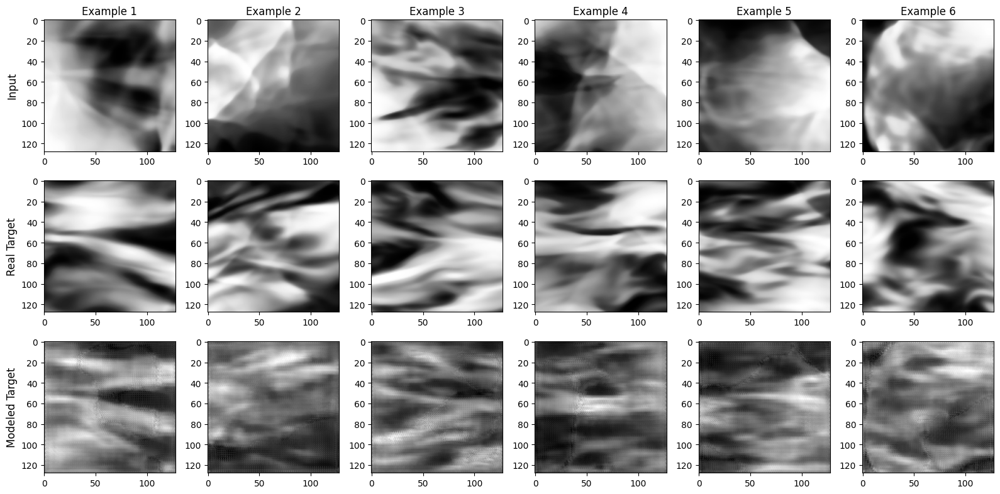

Epoch: 10 | Train Loss: 0.06778| Validation loss: 0.06900


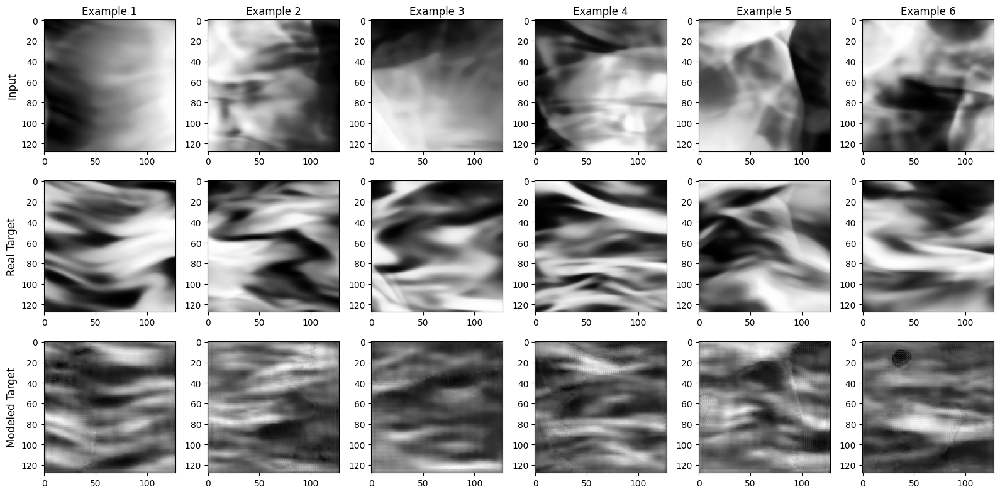

Epoch: 11 | Train Loss: 0.06734| Validation loss: 0.06835


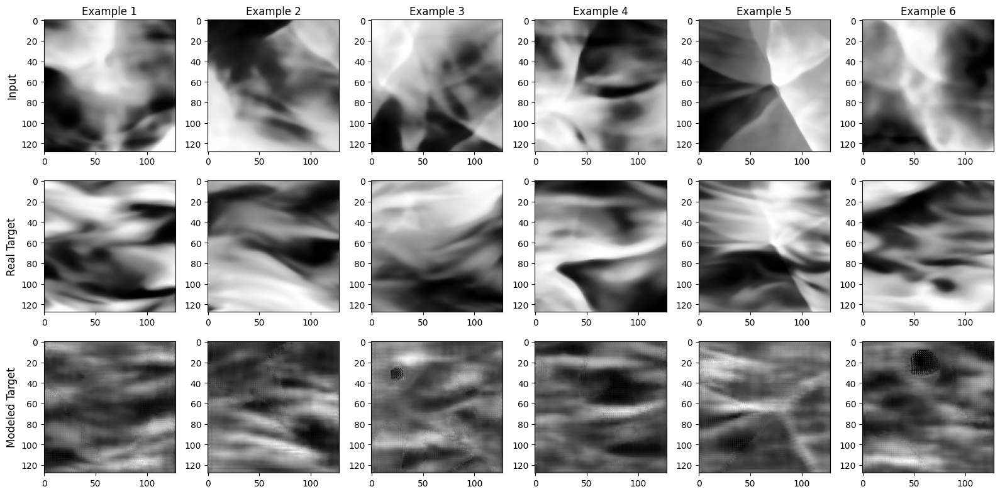

Saving model checkpoint
Epoch: 12 | Train Loss: 0.06695| Validation loss: 0.06741


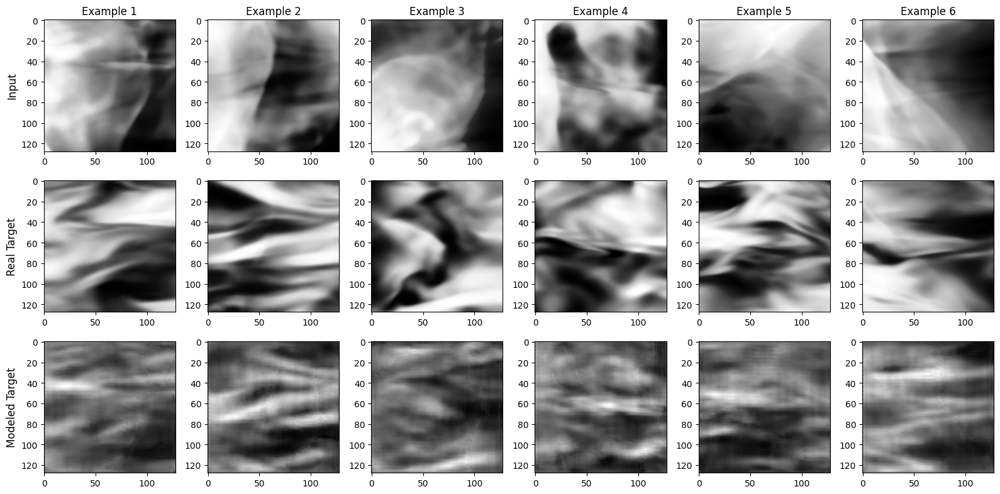

Saving model checkpoint
Epoch: 13 | Train Loss: 0.06673| Validation loss: 0.06752


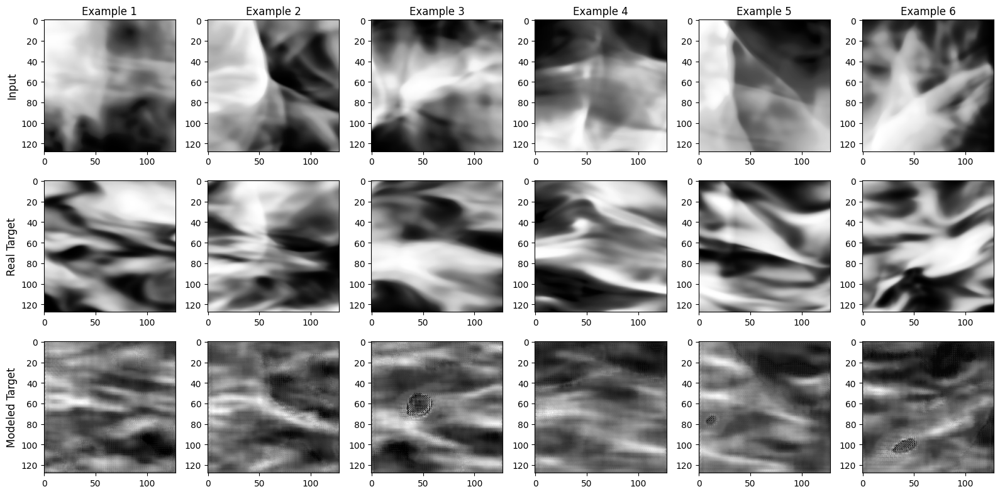

Epoch: 14 | Train Loss: 0.06632| Validation loss: 0.06786


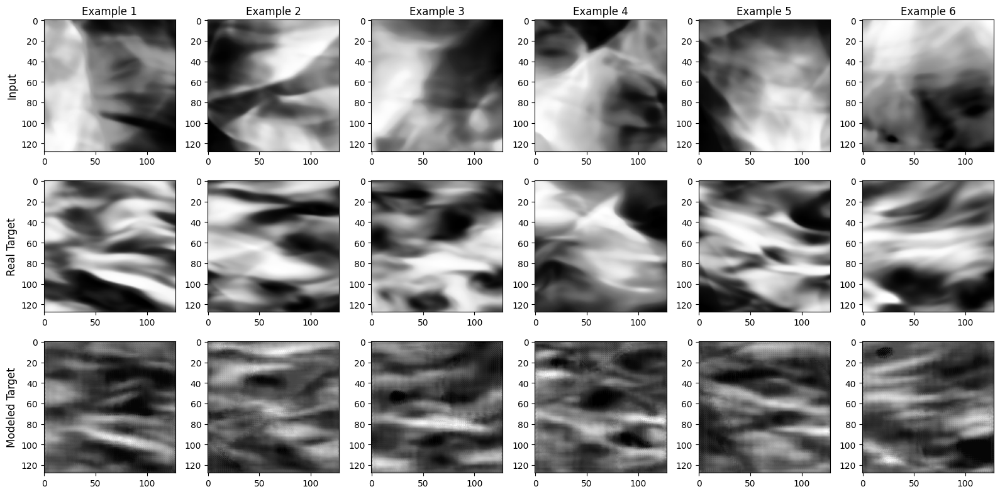

Epoch: 15 | Train Loss: 0.06607| Validation loss: 0.06697


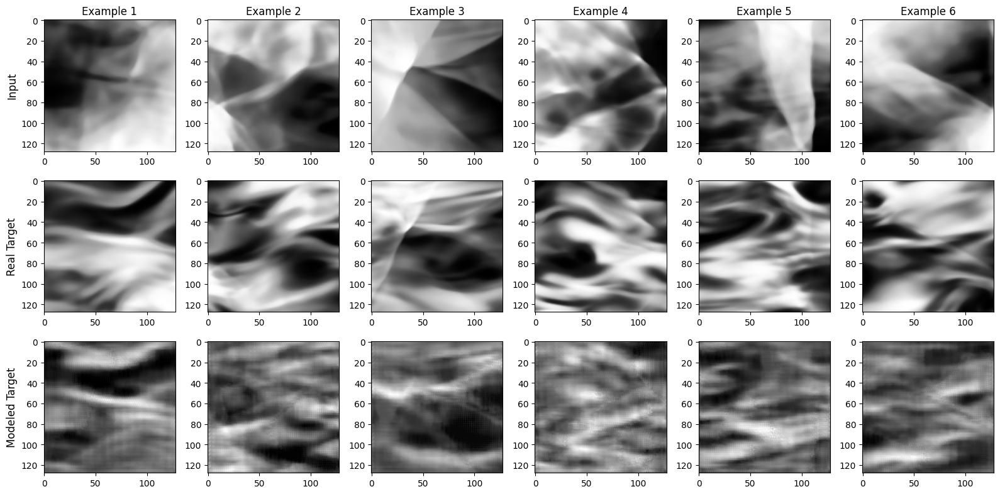

Saving model checkpoint
Epoch: 16 | Train Loss: 0.06576| Validation loss: 0.06700


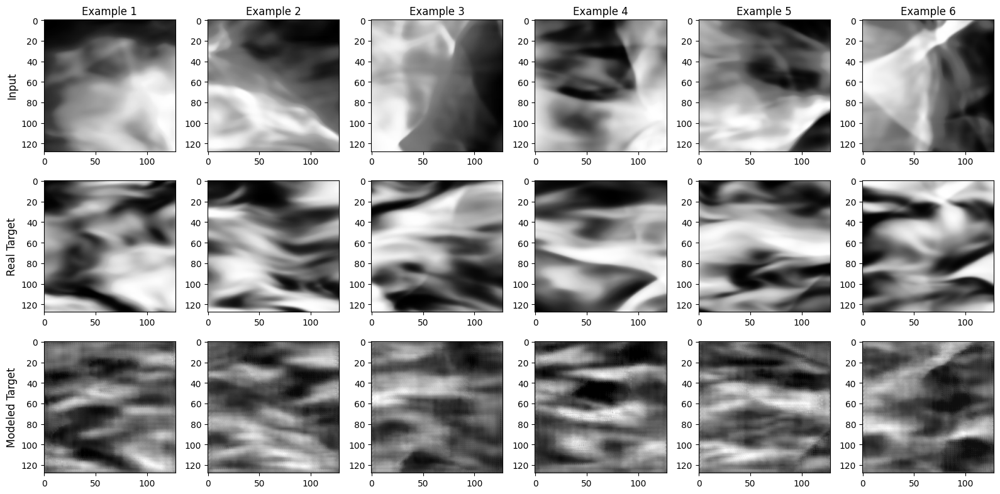

Epoch: 17 | Train Loss: 0.06560| Validation loss: 0.06714


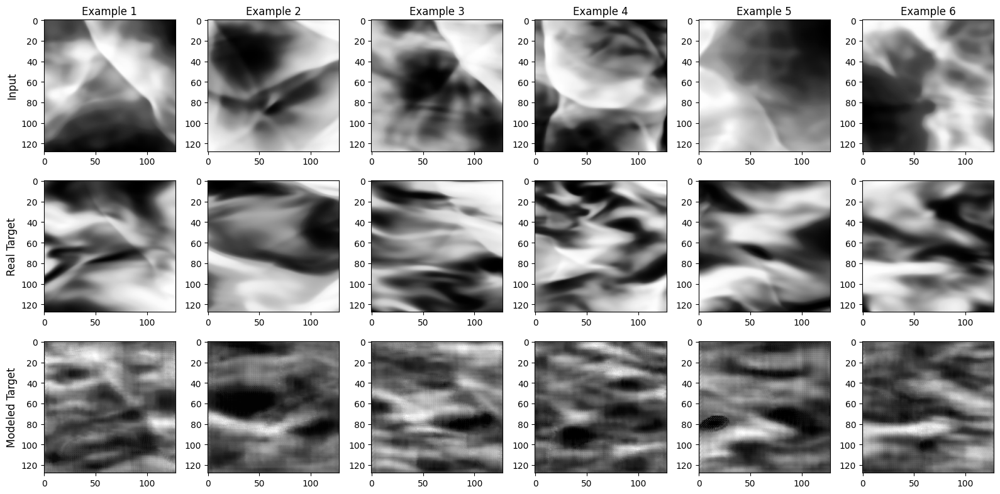

Epoch: 18 | Train Loss: 0.06535| Validation loss: 0.06685


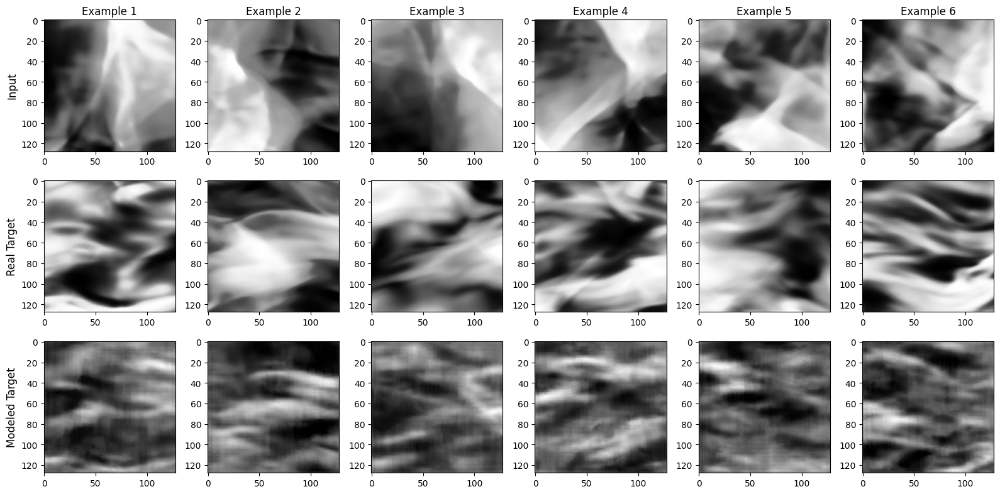

Saving model checkpoint
Epoch: 19 | Train Loss: 0.06511| Validation loss: 0.06753


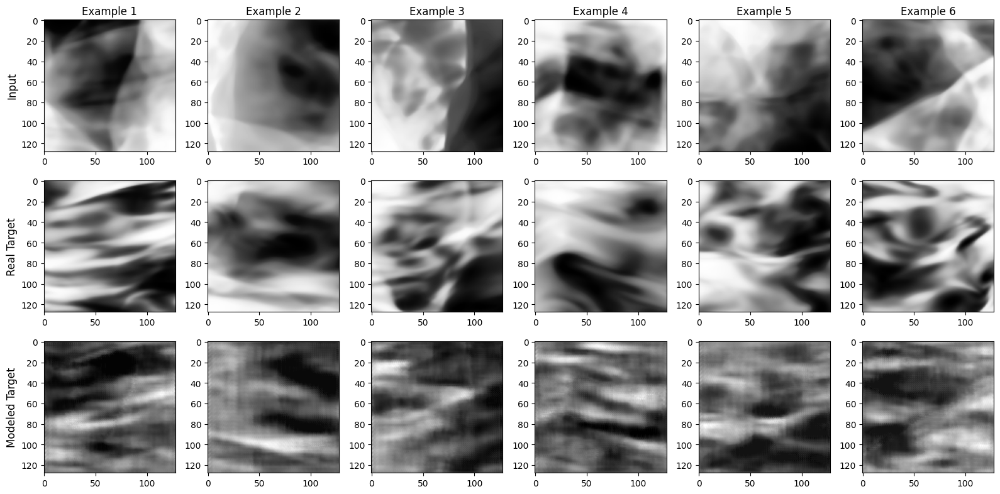

In [7]:
# run the model for different parameter choices

#batch_size = 32
config.epochs = 20
alpha = 0.001
lr = 1.e-3
start_filts = 8
weight_decay = 1.e-4
n_blocks = 4
lr = 1.e-3
for start_filts in [4]:
  #config.batch_size = batch_size
  run_name = 'Full_Power_depth_8_batch_size_'+str(config.batch_size)+'_ssimalpha_'+str(alpha)+'_lr_'+str(lr)+'_nblocks_'+str(n_blocks)+'_start_filts_'+str(start_filts)
  config.run_name = run_name


  # load data each time if changing batch size
  #train_dl, valid_dl, test_dl = load_data.preprocess(config)

  # create new model  
  model, loss_fn, opt = create_model(config, n_blocks, start_filts, lr, weight_decay)

  # run new model
  run_output = unet_setup.fit(config, model.to(device), loss_fn, opt, train_dl, valid_dl, alpha)
  model_trained, loss_arr_train, loss_arr_val, struc_arr_train, struc_arr_val = run_output
  
  # assumes training and validation loss are each quantified at every epoch
  num_epochs_run = np.arange(1,len(loss_arr_train)+1)

  # plotting parameters
  fs = 20

  if config.use_ssim:
    new_struc_arr_train = []
    for t in struc_arr_train:
      #t = t.cpu().detach().numpy()
      new_struc_arr_train.append(t)

    new_struc_arr_val = []
    for t in struc_arr_val:
      #t = t.cpu().detach().numpy()
      new_struc_arr_val.append(t)

  plt.plot(num_epochs_run, loss_arr_train, 'b-', label = f"Total Training Loss", lw=2)
  plt.plot(num_epochs_run, loss_arr_val, 'g-', label = f"Total Validation Loss", lw=2)
  if config.use_ssim:
    plt.plot(num_epochs_run, alpha*(np.ones(len(new_struc_arr_train))-new_struc_arr_train), 'b--', label = f"Training Loss due to SSIM", lw=2)
    plt.plot(num_epochs_run, alpha*(np.ones(len(new_struc_arr_val))-new_struc_arr_val), 'g--', label = f"Validation Loss due to SSIM", lw=2)
  
  plt.xlabel("Epoch", fontsize=fs)
  plt.title('batch size = ' + str(config.batch_size))
  plt.legend()
  plt.savefig(config.save_dir+config.run_name+'_Loss.png',dpi=600)
  plt.close()
  
  if config.use_ssim:
    plt.plot(num_epochs_run, new_struc_arr_train, label = f"Training SSIM", lw=2)
    plt.plot(num_epochs_run, new_struc_arr_val, label = f"Validation SSIM", lw=2)
    plt.xlabel("Epoch", fontsize=fs)
    plt.title('batch size = ' + str(config.batch_size))
    plt.legend()
    plt.savefig(config.save_dir+config.run_name+'_SSIM.png',dpi=600)
    plt.close()

  # Show comparison on training data instead of validation data
  #print("Results on training data")
  #unet_setup.plot_results(config, model_trained.cpu(), train_dl)

  #print("Results on validation data")
  #unet_setup.plot_results(config, model_trained.cpu(), valid_dl)


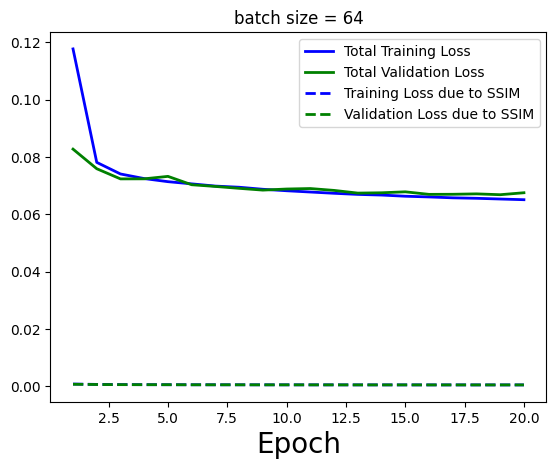

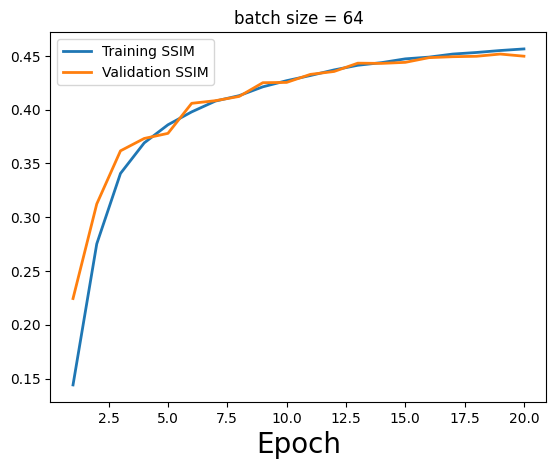

In [8]:
plt.plot(num_epochs_run, loss_arr_train, 'b-', label = f"Total Training Loss", lw=2)
plt.plot(num_epochs_run, loss_arr_val, 'g-', label = f"Total Validation Loss", lw=2)
if config.use_ssim:
  plt.plot(num_epochs_run, alpha*(np.ones(len(new_struc_arr_train))-new_struc_arr_train), 'b--', label = f"Training Loss due to SSIM", lw=2)
  plt.plot(num_epochs_run, alpha*(np.ones(len(new_struc_arr_val))-new_struc_arr_val), 'g--', label = f"Validation Loss due to SSIM", lw=2)

plt.xlabel("Epoch", fontsize=fs)
plt.title('batch size = ' + str(config.batch_size))
plt.legend()
plt.savefig(config.save_dir+config.run_name+'_Loss.png',dpi=600)
plt.show()
plt.close()

if config.use_ssim:
  plt.plot(num_epochs_run, new_struc_arr_train, label = f"Training SSIM", lw=2)
  plt.plot(num_epochs_run, new_struc_arr_val, label = f"Validation SSIM", lw=2)
  plt.xlabel("Epoch", fontsize=fs)
  plt.title('batch size = ' + str(config.batch_size))
  plt.legend()
  plt.savefig(config.save_dir+config.run_name+'_SSIM.png',dpi=600)
  plt.show()
  plt.close()

In [9]:
!tar -czvf 'MHD_beta10_depth_8.tar.gz' 'runs'

runs/
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nblocks_4_start_filts_4_image_epoch11.png
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nblocks_4_start_filts_4_image_epoch17.png
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nblocks_4_start_filts_4_image_epoch15.png
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nblocks_4_start_filts_4_SSIM.png
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nblocks_4_start_filts_4_image_epoch5.png
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nblocks_4_start_filts_4_checkpoint.pt
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nblocks_4_start_filts_4_image_epoch1.png
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nblocks_4_start_filts_4_image_epoch6.png
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nblocks_4_start_filts_4_image_epoch10.png
runs/Full_Power_depth_8_batch_size_64_ssimalpha_0.001_lr_0.001_nb